# Flower Species Classification using CNN

**Module:** 6CS012 - AI and Machine Learning  
**Task:** Vision Task - Image Classification with CNN  

In this notebook, we're building a deep learning model to classify flower species from images. The dataset has 5 types of flowers - Daisy, Dandelion, Rose, Sunflower, and Tulip. We'll start with a basic CNN, then try a deeper one, and finally use transfer learning with VGG16 to see how much better a pretrained model can do.

Our research question: *"How do different CNN architectures and hyperparameters influence the classification accuracy of diverse flower species in varied natural backgrounds?"*

## 1. Importing the necessary libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16

from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, precision_score, recall_score, f1_score)

# checking if gpu is available - this is important for training speed
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 2. Loading the Dataset

Our dataset is organized in Google Drive with a `Train` folder containing subfolders by class name (daisy, dandelion, rose, sunflower, tulip), and a `Test` folder with sample images for final prediction. We'll split the Train folder into training and validation sets (80/20), and use the Test folder images for inference demos at the end.

In [2]:
# mounting google drive to access the dataset
from google.colab import drive
drive.mount('/content/drive')

import pathlib

# --- Auto-detect the dataset path in Google Drive ---
# Search common locations for the Train folder
drive_root = pathlib.Path('/content/drive/MyDrive')

possible_paths = list(drive_root.glob('**/Train'))
# filter to only those that contain flower class subfolders
dataset_paths = []
for p in possible_paths:
    subfolders = [f.name for f in p.iterdir() if f.is_dir()]
    if any(name in subfolders for name in ['daisy', 'rose', 'tulip', 'sunflower', 'dandelion']):
        dataset_paths.append(p.parent)

if dataset_paths:
    base_dir = dataset_paths[0]
    print(f"Found dataset at: {base_dir}")
else:
    # fallback - set manually if auto-detect fails
    base_dir = drive_root / 'Flower Classification'
    print(f"Auto-detect failed. Using default path: {base_dir}")

train_dir = base_dir / 'Train'
test_dir = base_dir / 'Test'

print(f"\nTrain directory: {train_dir}")
print(f"Train folders found: {os.listdir(train_dir)}")
print(f"\nTest directory: {test_dir}")
print(f"Test images found: {os.listdir(test_dir)}")

Mounted at /content/drive
Found dataset at: /content/drive/MyDrive/Flower Classification

Train directory: /content/drive/MyDrive/Flower Classification/Train
Train folders found: ['dandelion', 'rose', 'daisy', 'sunflower', 'tulip']

Test directory: /content/drive/MyDrive/Flower Classification/Test
Test images found: ['40410814_fba3837226_n.jpg', '110472418_87b6a3aa98_m.jpg', '113960470_38fab8f2fb_m.jpg', '153210866_03cc9f2f36.jpg', '16159487_3a6615a565_n.jpg']


### 2.1 Understanding the Dataset

The dataset represents real-world photographs of 5 flower species collected from various online sources. The images come in different resolutions and have various natural backgrounds (grass, dirt, sky etc). Let's look at how many images we have in each class and check if there are any corrupted files.

In [3]:
# let's count images in each class and also check for corrupted ones
# corrupted images will be deleted so they don't crash training later
from PIL import Image

class_names = sorted([item.name for item in train_dir.iterdir() if item.is_dir()])
print("Classes found:", class_names)
print("Number of classes:", len(class_names))
print()

total_images = 0
total_corrupted = 0
class_counts = {}
corrupted_count = {}

for class_name in class_names:
    class_dir = train_dir / class_name
    images = list(class_dir.glob('*'))
    valid = 0
    corrupted = 0
    for img_path in images:
        try:
            img = Image.open(str(img_path))
            img.verify()  # verify the image is not corrupted
            valid += 1
        except:
            corrupted += 1
            os.remove(str(img_path))  # remove corrupted file so it doesn't crash training
    class_counts[class_name] = valid
    corrupted_count[class_name] = corrupted
    total_images += valid
    total_corrupted += corrupted
    print(f"  {class_name}: {valid} valid images, {corrupted} corrupted (removed)")

print(f"\nTotal usable images: {total_images}")
print(f"Total corrupted (removed): {total_corrupted}")
print(f"\nTest folder contains {len(list(test_dir.glob('*')))} sample images for inference")

Classes found: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Number of classes: 5

  daisy: 756 valid images, 0 corrupted (removed)
  dandelion: 1044 valid images, 0 corrupted (removed)
  rose: 776 valid images, 0 corrupted (removed)
  sunflower: 725 valid images, 0 corrupted (removed)
  tulip: 976 valid images, 0 corrupted (removed)

Total usable images: 4277
Total corrupted (removed): 0

Test folder contains 5 sample images for inference


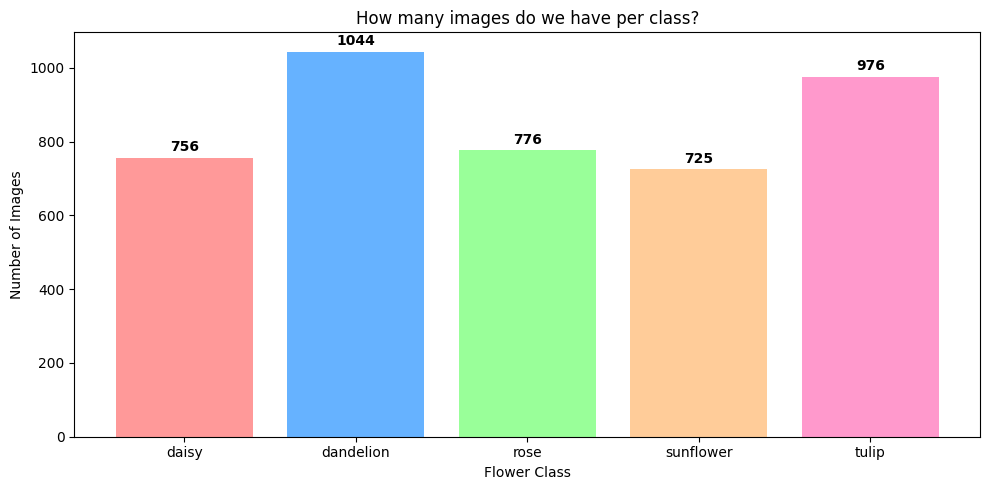

Imbalance ratio (largest class / smallest class): 1.44
There's a mild imbalance here - dandelion has the most images while sunflower has the least.
We'll use F1-score as our primary metric to account for this.


In [4]:
# plotting the class distribution to see if there's any imbalance
plt.figure(figsize=(10, 5))
bars = plt.bar(class_counts.keys(), class_counts.values(),
               color=['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC'])
plt.xlabel('Flower Class')
plt.ylabel('Number of Images')
plt.title('How many images do we have per class?')

for bar, count in zip(bars, class_counts.values()):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 10,
             str(count), ha='center', va='bottom', fontweight='bold')
plt.tight_layout()
plt.show()

# checking the imbalance
max_count = max(class_counts.values())
min_count = min(class_counts.values())
print(f"Imbalance ratio (largest class / smallest class): {max_count/min_count:.2f}")
print("There's a mild imbalance here - dandelion has the most images while sunflower has the least.")
print("We'll use F1-score as our primary metric to account for this.")

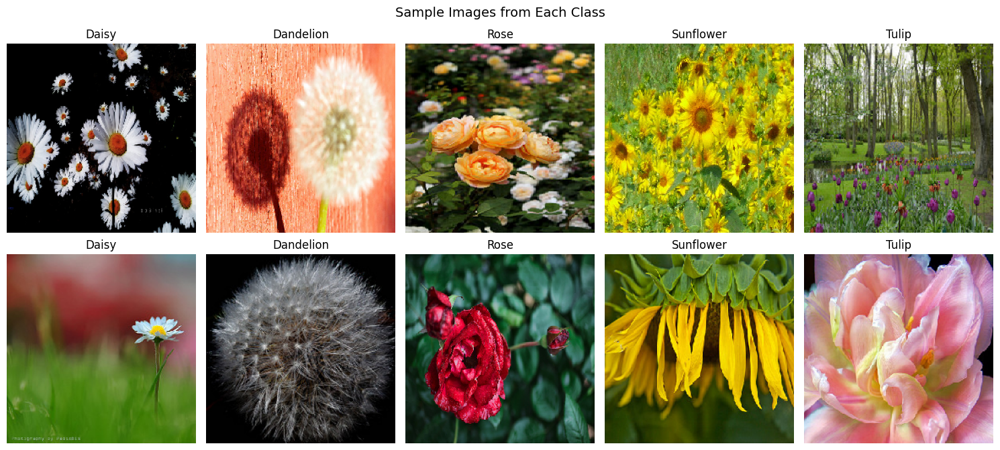

In [5]:
# let's see what these flowers actually look like
fig, axes = plt.subplots(2, 5, figsize=(15, 7))
fig.suptitle('Sample Images from Each Class', fontsize=14)

for idx, class_name in enumerate(class_names):
    class_dir = train_dir / class_name
    sample_images = list(class_dir.glob('*.jpg'))[:2]

    for row, img_path in enumerate(sample_images):
        img = keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
        axes[row, idx].imshow(img)
        axes[row, idx].set_title(class_name.capitalize())
        axes[row, idx].axis('off')

plt.tight_layout()
plt.show()

# some observations from looking at the images:
# - roses come in different colors (red, pink, white) which might confuse the model
# - dandelions and sunflowers look somewhat similar (both yellow)
# - backgrounds are very different across images

In [6]:
# checking the resolutions - i noticed images seem to be different sizes
resolutions = []
for class_name in class_names:
    class_dir = train_dir / class_name
    for img_path in list(class_dir.glob('*.jpg'))[:50]:  # sampling 50 per class
        img = keras.preprocessing.image.load_img(img_path)
        resolutions.append(img.size)

unique_resolutions = set(resolutions)
print(f"Unique resolutions found (from sample): {len(unique_resolutions)}")
print(f"Some examples: {list(unique_resolutions)[:8]}")
print()
print("So yeah, there's a huge variety in image sizes.")
print("We definitely need to resize everything to a fixed size before feeding to the CNN.")
print("Going with 224x224 since that's what VGG16 expects (useful for Part B later).")

Unique resolutions found (from sample): 73
Some examples: [(500, 316), (500, 322), (320, 248), (500, 334), (163, 240), (500, 331), (320, 254), (500, 337)]

So yeah, there's a huge variety in image sizes.
We definitely need to resize everything to a fixed size before feeding to the CNN.
Going with 224x224 since that's what VGG16 expects (useful for Part B later).


## 3. Data Preprocessing and Augmentation

Now we need to prepare the data for training. Here's what we'll do:

- **Resize** all images to 224x224 (handles the resolution variability issue)
- **Normalize** pixel values to 0-1 range (helps the model converge faster)
- **Split** the Train folder into 80% training and 20% validation
- **Augment** training images with random transformations

**Why 80/20 split?** With ~4300 images, this gives us around 3400 for training and 860 for validation. That's a good balance - enough training data for the CNN to learn patterns, and enough validation samples to get a reliable accuracy estimate. We considered 70/30 but felt we needed more training data given the complexity of the task.

**Why augmentation?** Our dataset is relatively small for a CNN. By applying random rotations, flips, and zooms, we effectively create "new" training examples. This helps prevent overfitting and makes the model more robust to different angles and positions of flowers in real photos.

In [7]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

# training generator - with augmentation to make the model more robust
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,          # normalize to 0-1
    rotation_range=30,           # random rotation up to 30 degrees
    width_shift_range=0.2,       # shift horizontally
    height_shift_range=0.2,      # shift vertically
    shear_range=0.2,
    zoom_range=0.2,              # random zoom
    horizontal_flip=True,        # flip left-right
    fill_mode='nearest',
    validation_split=0.2         # 80-20 split
)

# validation generator - NO augmentation here, just rescaling
# we want to evaluate on clean untouched images
val_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    seed=SEED,
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    seed=SEED,
    shuffle=False
)

print(f"\nTraining samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")
print(f"Class mapping: {train_generator.class_indices}")

Found 3423 images belonging to 5 classes.
Found 854 images belonging to 5 classes.

Training samples: 3423
Validation samples: 854
Class mapping: {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}


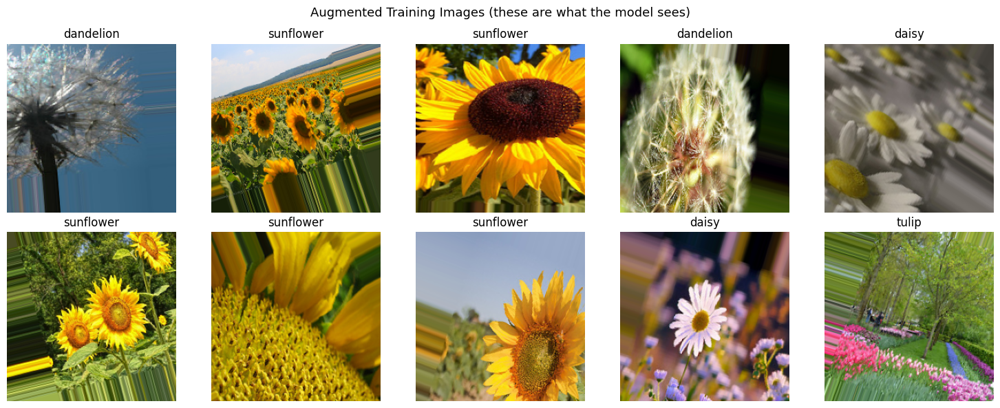

As we can see, the images are slightly rotated, zoomed, and flipped.
This should help the model generalize better to unseen images.


In [8]:
# let's visualize what the augmented images look like
# this helps us verify the augmentations aren't too aggressive
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle('Augmented Training Images (these are what the model sees)', fontsize=13)

batch_images, batch_labels = next(train_generator)
class_labels = list(train_generator.class_indices.keys())

for i in range(10):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(batch_images[i])
    label_idx = np.argmax(batch_labels[i])
    axes[row, col].set_title(class_labels[label_idx])
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()
print("As we can see, the images are slightly rotated, zoomed, and flipped.")
print("This should help the model generalize better to unseen images.")

---
## 4. Part A: Building CNNs from Scratch

### 4.1 Baseline Model

We'll start simple - 3 convolutional layers with max pooling, followed by 3 dense layers and the output. No fancy regularization yet, just the basics. This gives us a baseline to compare against later.

In [9]:
# building a simple baseline CNN
# structure: 3 conv+pool blocks -> flatten -> 3 dense layers -> output

def build_baseline_model():
    model = models.Sequential([
        # first conv block - 32 filters, small 3x3 kernel
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        layers.MaxPooling2D((2, 2)),

        # second conv block - 64 filters to capture more complex features
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        # third conv block - 128 filters
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),

        # fully connected layers
        layers.Dense(512, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),

        # output - 5 classes so 5 neurons with softmax
        layers.Dense(5, activation='softmax')
    ])
    return model

baseline_model = build_baseline_model()

# let's look at the architecture
baseline_model.summary()
# the model has quite a lot of parameters in the dense layers because
# the flattened feature map is large (224x224 input is big)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    44,302,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,560,965 (169.99 MB)

 Trainable params: 44,560,965 (169.99 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# compile with adam optimizer and categorical crossentropy (since we have 5 classes)
baseline_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# training the baseline model
# using early stopping so we don't waste time if it stops improving
EPOCHS_BASELINE = 25

print("Training baseline model... this might take a while")
start_time = time.time()

baseline_history = baseline_model.fit(
    train_generator,
    epochs=EPOCHS_BASELINE,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
    ]
)

baseline_training_time = time.time() - start_time
print(f"\nDone! Took {baseline_training_time:.2f} seconds")

Training baseline model... this might take a while
Epoch 1/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 84s 692ms/step - accuracy: 0.3885 - loss: 1.4124 - val_accuracy: 0.4567 - val_loss: 1.3392 - learning_rate: 0.0010
Epoch 2/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 603ms/step - accuracy: 0.5375 - loss: 1.1127 - val_accuracy: 0.6054 - val_loss: 1.0035 - learning_rate: 0.0010
Epoch 3/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 606ms/step - accuracy: 0.5732 - loss: 1.0410 - val_accuracy: 0.6276 - val_loss: 0.9680 - learning_rate: 0.0010
Epoch 4/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 67s 623ms/step - accuracy: 0.6088 - loss: 0.9829 - val_accuracy: 0.6522 - val_loss: 0.8736 - learning_rate: 0.0010
Epoch 5/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 612ms/step - accuracy: 0.6284 - loss: 0.9221 - val_accuracy: 0.6487 - val_loss: 0.9074 - learning_rate: 0.0010
Epoch 6/25
107/107 ━━━━━━━━━━━━━━━━━━━━ 67s 630ms/step - accuracy: 0.6579 - loss: 0.8930 - val_accuracy: 0.6382 - val_loss: 0.8629 - learning_rate: 0.0010
Epoch 7/25
107/107 

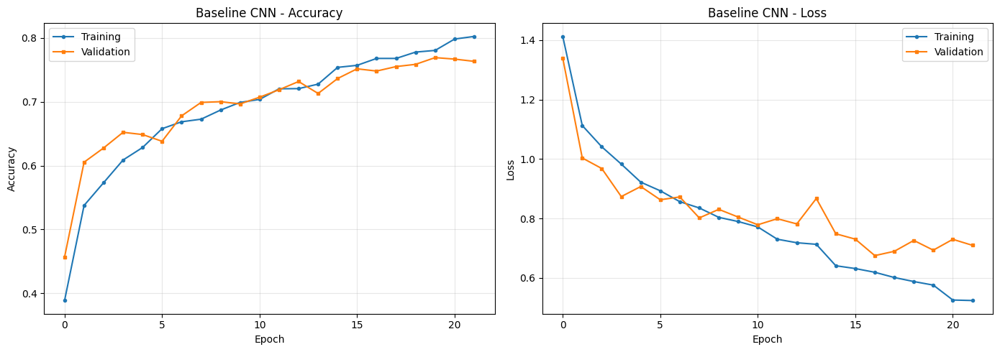

In [11]:
# plotting how training went - looking for signs of overfitting
def plot_training_history(history, title="Model"):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # accuracy plot
    ax1.plot(history.history['accuracy'], label='Training', marker='o', markersize=3)
    ax1.plot(history.history['val_accuracy'], label='Validation', marker='s', markersize=3)
    ax1.set_title(f'{title} - Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # loss plot
    ax2.plot(history.history['loss'], label='Training', marker='o', markersize=3)
    ax2.plot(history.history['val_loss'], label='Validation', marker='s', markersize=3)
    ax2.set_title(f'{title} - Loss')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_training_history(baseline_history, "Baseline CNN")
# if we see training acc going up but val acc plateauing/dropping, that's overfitting


  Baseline CNN - Results

Classification Report:
              precision    recall  f1-score   support

       daisy       0.81      0.77      0.79       151
   dandelion       0.81      0.79      0.80       208
        rose       0.63      0.64      0.64       155
   sunflower       0.71      0.83      0.76       145
       tulip       0.77      0.71      0.74       195

    accuracy                           0.75       854
   macro avg       0.75      0.75      0.75       854
weighted avg       0.75      0.75      0.75       854

Accuracy:  0.7482
Precision: 0.7508
Recall:    0.7482
F1-Score:  0.7484


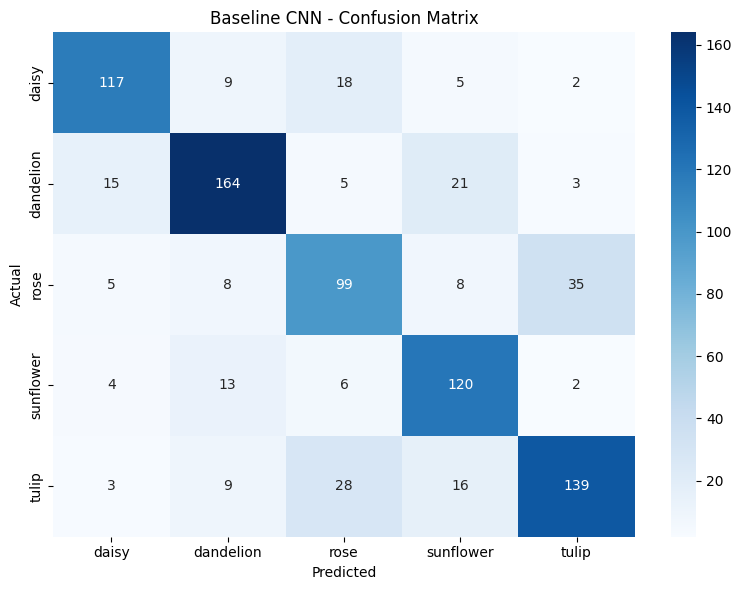

In [12]:
# evaluating the baseline model properly with all metrics
def evaluate_model(model, generator, model_name="Model"):
    generator.reset()
    predictions = model.predict(generator, verbose=0)
    y_pred = np.argmax(predictions, axis=1)
    y_true = generator.classes

    class_labels = list(generator.class_indices.keys())

    print(f"\n{'='*55}")
    print(f"  {model_name} - Results")
    print(f"{'='*55}")
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_labels))

    # individual metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1-Score:  {f1:.4f}")

    # confusion matrix to see which classes get confused
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

    return {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1}

baseline_metrics = evaluate_model(baseline_model, val_generator, "Baseline CNN")

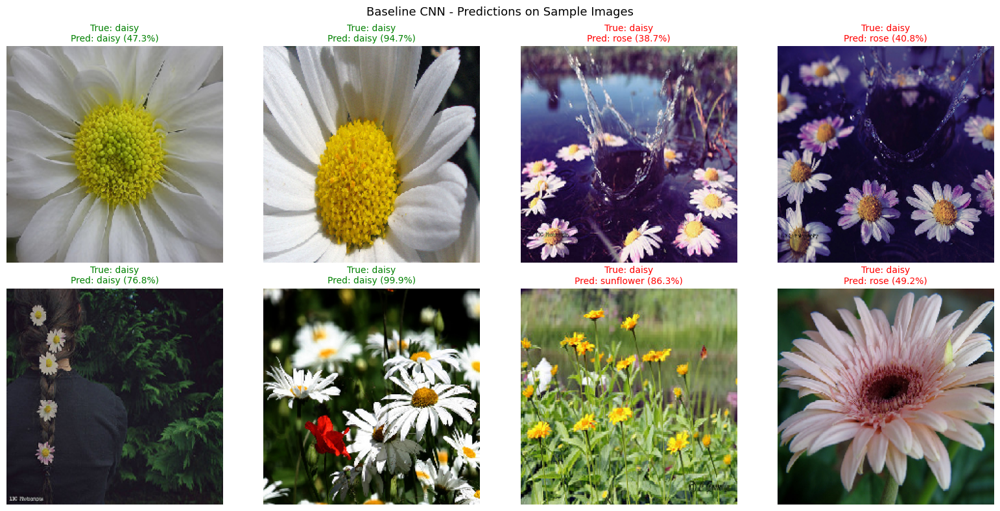

In [13]:
# let's see how it does on individual images
def predict_samples(model, generator, model_name="Model", num_samples=8):
    generator.reset()
    batch_images, batch_labels = next(generator)
    predictions = model.predict(batch_images, verbose=0)
    class_labels = list(generator.class_indices.keys())

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{model_name} - Predictions on Sample Images', fontsize=13)

    for i in range(num_samples):
        row = i // 4
        col = i % 4
        axes[row, col].imshow(batch_images[i])

        true_label = class_labels[np.argmax(batch_labels[i])]
        pred_label = class_labels[np.argmax(predictions[i])]
        confidence = np.max(predictions[i]) * 100

        color = 'green' if true_label == pred_label else 'red'
        axes[row, col].set_title(
            f'True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)',
            color=color, fontsize=10)
        axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

predict_samples(baseline_model, val_generator, "Baseline CNN")
# green = correct, red = wrong

### 4.2 Deeper Model with Regularization

The baseline is ok but probably overfitting since there's no regularization. Let's build a deeper model with:
- 6 convolutional layers (doubled from baseline) with more filters
- Batch Normalization to stabilize training
- Dropout to prevent overfitting (0.25 in conv blocks, 0.5 in dense layers)

The idea is that more layers = more complex features learned, and regularization keeps it from memorizing the training set.

In [14]:
# deeper CNN with batch norm and dropout
def build_deeper_model():
    model = models.Sequential([
        # block 1 - two conv layers instead of one
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # block 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # block 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        layers.Flatten(),

        # dense layers with heavy dropout
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),

        layers.Dense(128, activation='relu'),
        layers.Dropout(0.5),

        layers.Dense(5, activation='softmax')
    ])
    return model

deeper_model = build_deeper_model()
deeper_model.summary()
# notice how many more parameters this has compared to baseline

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │    51,380,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 51,837,477 (197.74 MB)

 Trainable params: 51,835,045 (197.74 MB)

 Non-trainable params: 2,432 (9.50 KB)

In [15]:
# training the deeper model - using Adam first
deeper_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS_DEEPER = 30

print("Training deeper model with Adam... this will take longer than baseline")
start_time = time.time()

deeper_history = deeper_model.fit(
    train_generator,
    epochs=EPOCHS_DEEPER,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
    ]
)

deeper_training_time = time.time() - start_time
print(f"\nDone! Took {deeper_training_time:.2f} seconds")
print(f"That's {deeper_training_time/baseline_training_time:.1f}x longer than the baseline")

Training deeper model with Adam... this will take longer than baseline
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 128s 937ms/step - accuracy: 0.3044 - loss: 2.1600 - val_accuracy: 0.2436 - val_loss: 6.0642 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 604ms/step - accuracy: 0.3935 - loss: 1.6681 - val_accuracy: 0.2436 - val_loss: 2.5079 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 69s 644ms/step - accuracy: 0.4391 - loss: 1.4565 - val_accuracy: 0.2810 - val_loss: 2.0673 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 66s 613ms/step - accuracy: 0.4701 - loss: 1.3087 - val_accuracy: 0.3794 - val_loss: 1.4498 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 599ms/step - accuracy: 0.5121 - loss: 1.2155 - val_accuracy: 0.4403 - val_loss: 1.3314 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 73s 678ms/step - accuracy: 0.5247 - loss: 1.1595 - val_accuracy: 0.5340 - val_loss: 1.0793 - learning_rate: 0.001

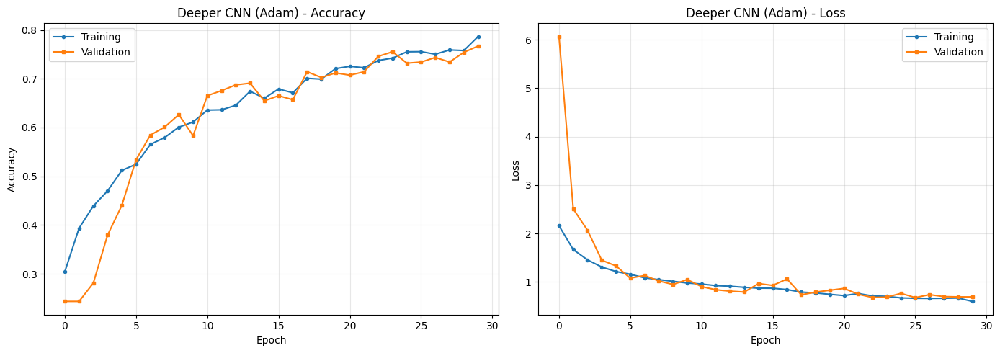


  Deeper CNN (Adam) - Results

Classification Report:
              precision    recall  f1-score   support

       daisy       0.93      0.57      0.71       151
   dandelion       0.68      0.90      0.78       208
        rose       0.66      0.64      0.65       155
   sunflower       0.78      0.80      0.79       145
       tulip       0.75      0.71      0.73       195

    accuracy                           0.73       854
   macro avg       0.76      0.72      0.73       854
weighted avg       0.75      0.73      0.73       854

Accuracy:  0.7342
Precision: 0.7521
Recall:    0.7342
F1-Score:  0.7312


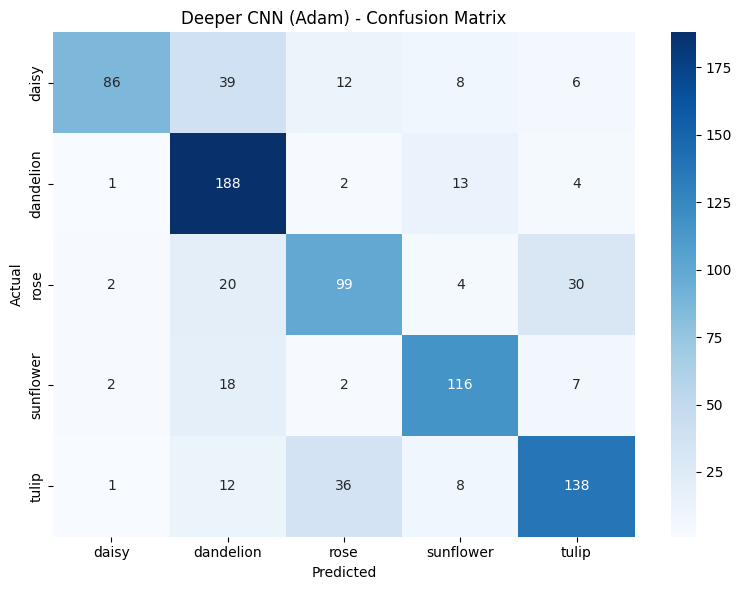

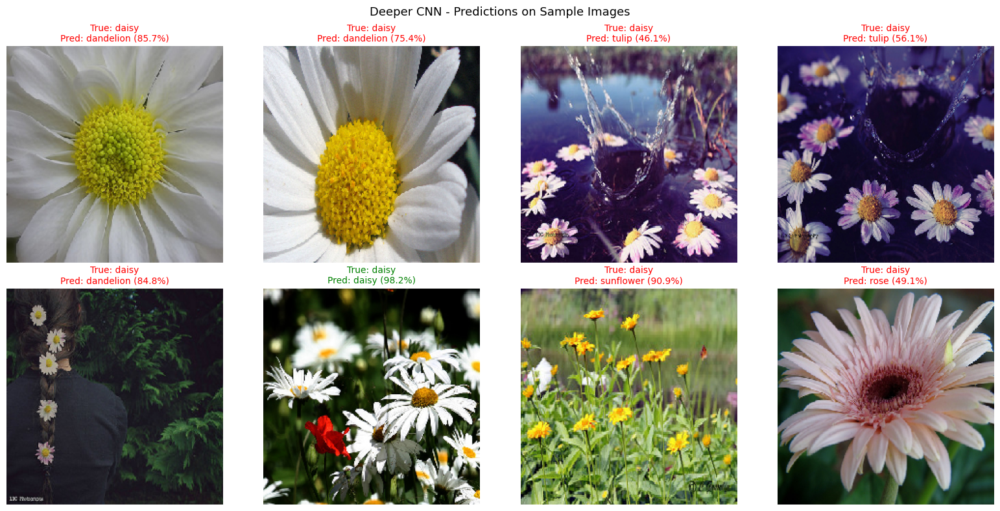

In [16]:
# how did the deeper model do?
plot_training_history(deeper_history, "Deeper CNN (Adam)")
deeper_metrics = evaluate_model(deeper_model, val_generator, "Deeper CNN (Adam)")
predict_samples(deeper_model, val_generator, "Deeper CNN")

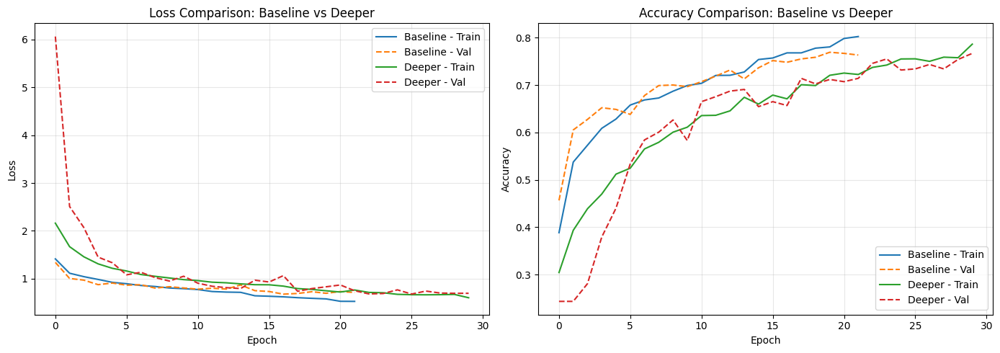


Training time comparison:
  Baseline: 1449.7s
  Deeper:   2013.6s  (1.4x slower)

The deeper model takes longer but hopefully gives better results.
The gap between train and val curves also looks smaller thanks to dropout.


In [17]:
# direct comparison: baseline vs deeper model training curves
# putting them on the same plot so we can see the difference clearly

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# loss comparison
axes[0].plot(baseline_history.history['loss'], label='Baseline - Train', linestyle='-')
axes[0].plot(baseline_history.history['val_loss'], label='Baseline - Val', linestyle='--')
axes[0].plot(deeper_history.history['loss'], label='Deeper - Train', linestyle='-')
axes[0].plot(deeper_history.history['val_loss'], label='Deeper - Val', linestyle='--')
axes[0].set_title('Loss Comparison: Baseline vs Deeper')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# accuracy comparison
axes[1].plot(baseline_history.history['accuracy'], label='Baseline - Train', linestyle='-')
axes[1].plot(baseline_history.history['val_accuracy'], label='Baseline - Val', linestyle='--')
axes[1].plot(deeper_history.history['accuracy'], label='Deeper - Train', linestyle='-')
axes[1].plot(deeper_history.history['val_accuracy'], label='Deeper - Val', linestyle='--')
axes[1].set_title('Accuracy Comparison: Baseline vs Deeper')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nTraining time comparison:")
print(f"  Baseline: {baseline_training_time:.1f}s")
print(f"  Deeper:   {deeper_training_time:.1f}s  ({deeper_training_time/baseline_training_time:.1f}x slower)")
print(f"\nThe deeper model takes longer but hopefully gives better results.")
print(f"The gap between train and val curves also looks smaller thanks to dropout.")

### 4.3 Experimentation

#### SGD vs Adam - which optimizer works better?

Adam is popular because it adapts the learning rate automatically, but SGD with momentum is sometimes better for generalization. Let's train the same deeper model with SGD and compare.

In [18]:
# same architecture but with SGD optimizer instead of Adam
deeper_model_sgd = build_deeper_model()
deeper_model_sgd.compile(
    optimizer=optimizers.SGD(learning_rate=0.01, momentum=0.9),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Training deeper model with SGD (lr=0.01, momentum=0.9)...")
start_time = time.time()

deeper_sgd_history = deeper_model_sgd.fit(
    train_generator,
    epochs=EPOCHS_DEEPER,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
    ]
)

deeper_sgd_training_time = time.time() - start_time
print(f"\nDone! SGD took {deeper_sgd_training_time:.2f} seconds")

Training deeper model with SGD (lr=0.01, momentum=0.9)...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 85s 684ms/step - accuracy: 0.2962 - loss: 1.9490 - val_accuracy: 0.2494 - val_loss: 5.7664 - learning_rate: 0.0100
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 595ms/step - accuracy: 0.3807 - loss: 1.5321 - val_accuracy: 0.4555 - val_loss: 1.2618 - learning_rate: 0.0100
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 609ms/step - accuracy: 0.4005 - loss: 1.4351 - val_accuracy: 0.4532 - val_loss: 1.2377 - learning_rate: 0.0100
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 602ms/step - accuracy: 0.4330 - loss: 1.3588 - val_accuracy: 0.4965 - val_loss: 1.1934 - learning_rate: 0.0100
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 66s 611ms/step - accuracy: 0.4578 - loss: 1.3281 - val_accuracy: 0.4883 - val_loss: 1.2413 - learning_rate: 0.0100
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 607ms/step - accuracy: 0.4657 - loss: 1.2914 - val_accuracy: 0.5492 - val_loss: 1.1208 - learning_rate: 0.0100
Epoch 7/30
1

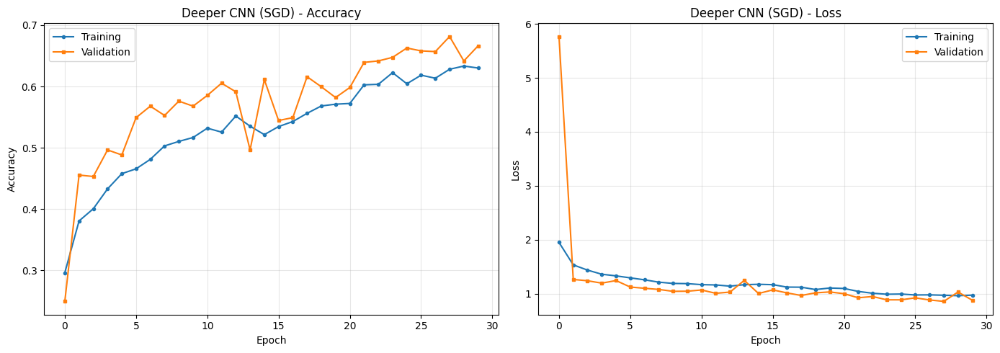


  Deeper CNN (SGD) - Results

Classification Report:
              precision    recall  f1-score   support

       daisy       0.81      0.62      0.70       151
   dandelion       0.65      0.86      0.74       208
        rose       0.60      0.52      0.55       155
   sunflower       0.75      0.75      0.75       145
       tulip       0.66      0.63      0.64       195

    accuracy                           0.68       854
   macro avg       0.69      0.67      0.68       854
weighted avg       0.69      0.68      0.68       854

Accuracy:  0.6815
Precision: 0.6872
Recall:    0.6815
F1-Score:  0.6779


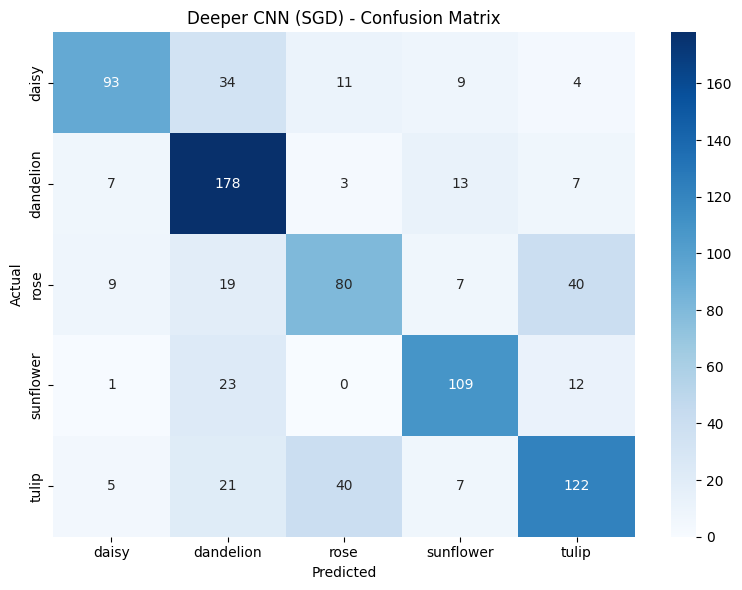

In [19]:
plot_training_history(deeper_sgd_history, "Deeper CNN (SGD)")
deeper_sgd_metrics = evaluate_model(deeper_model_sgd, val_generator, "Deeper CNN (SGD)")

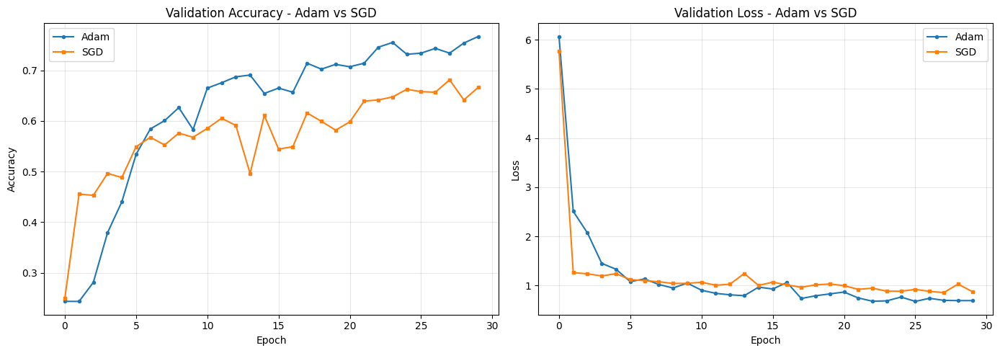


Optimizer Comparison:
Metric               Adam         SGD         
--------------------------------------------
Accuracy             0.7342       0.6815      
F1-Score             0.7312       0.6779      
Training Time        2013.6       1977.3      

Adam usually converges faster in the early epochs.
SGD with momentum can sometimes reach a better final result but needs more tuning.


In [20]:
# head to head: Adam vs SGD on the same architecture
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(deeper_history.history['val_accuracy'], label='Adam', marker='o', markersize=3)
ax1.plot(deeper_sgd_history.history['val_accuracy'], label='SGD', marker='s', markersize=3)
ax1.set_title('Validation Accuracy - Adam vs SGD')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(deeper_history.history['val_loss'], label='Adam', marker='o', markersize=3)
ax2.plot(deeper_sgd_history.history['val_loss'], label='SGD', marker='s', markersize=3)
ax2.set_title('Validation Loss - Adam vs SGD')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nOptimizer Comparison:")
print(f"{'Metric':<20} {'Adam':<12} {'SGD':<12}")
print(f"{'-'*44}")
print(f"{'Accuracy':<20} {deeper_metrics['accuracy']:<12.4f} {deeper_sgd_metrics['accuracy']:<12.4f}")
print(f"{'F1-Score':<20} {deeper_metrics['f1']:<12.4f} {deeper_sgd_metrics['f1']:<12.4f}")
print(f"{'Training Time':<20} {deeper_training_time:<12.1f} {deeper_sgd_training_time:<12.1f}")
print()
print("Adam usually converges faster in the early epochs.")
print("SGD with momentum can sometimes reach a better final result but needs more tuning.")

#### Ablation Study - What happens if we remove dropout?

To understand how important dropout is, let's train the same deeper architecture but without any dropout layers. If the model overfits more without dropout, that confirms dropout was actually helping.

In [21]:
# same deeper model but NO dropout anywhere
def build_deeper_model_no_dropout():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(224, 224, 3)),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        # no dropout here!

        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),

        # no dropout in dense layers either
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dense(128, activation='relu'),

        layers.Dense(5, activation='softmax')
    ])
    return model

ablation_model = build_deeper_model_no_dropout()
ablation_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Ablation: Training without dropout...")
start_time = time.time()

ablation_history = ablation_model.fit(
    train_generator,
    epochs=EPOCHS_DEEPER,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
    ]
)

ablation_training_time = time.time() - start_time
print(f"\nDone in {ablation_training_time:.2f} seconds")

Ablation: Training without dropout...
Epoch 1/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 79s 653ms/step - accuracy: 0.4724 - loss: 1.3080 - val_accuracy: 0.2436 - val_loss: 2.8261 - learning_rate: 0.0010
Epoch 2/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 598ms/step - accuracy: 0.5805 - loss: 1.0594 - val_accuracy: 0.2658 - val_loss: 3.9767 - learning_rate: 0.0010
Epoch 3/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 63s 588ms/step - accuracy: 0.6009 - loss: 0.9999 - val_accuracy: 0.3841 - val_loss: 2.4688 - learning_rate: 0.0010
Epoch 4/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 64s 597ms/step - accuracy: 0.6369 - loss: 0.9235 - val_accuracy: 0.5105 - val_loss: 1.3347 - learning_rate: 0.0010
Epoch 5/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 63s 592ms/step - accuracy: 0.6465 - loss: 0.8932 - val_accuracy: 0.6311 - val_loss: 1.0245 - learning_rate: 0.0010
Epoch 6/30
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 607ms/step - accuracy: 0.6474 - loss: 0.8874 - val_accuracy: 0.6768 - val_loss: 0.8650 - learning_rate: 0.0010
Epoch 7/30
107/107 ━━━━━━━━━━━━━

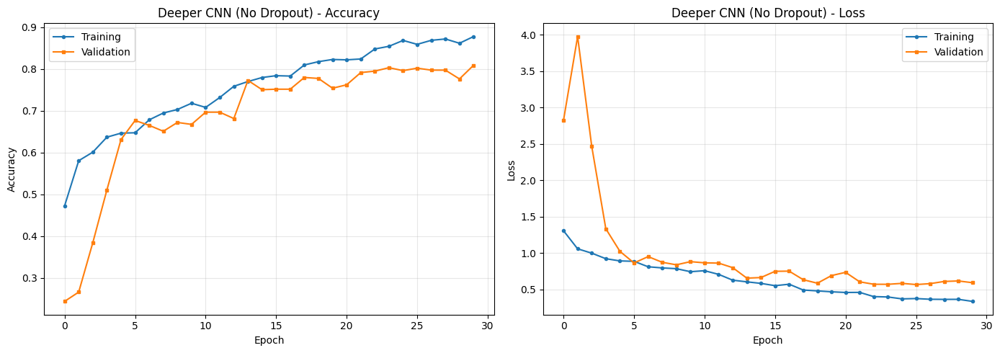


  Deeper CNN (No Dropout) - Results

Classification Report:
              precision    recall  f1-score   support

       daisy       0.86      0.83      0.84       151
   dandelion       0.89      0.86      0.87       208
        rose       0.71      0.70      0.70       155
   sunflower       0.79      0.83      0.81       145
       tulip       0.75      0.79      0.77       195

    accuracy                           0.80       854
   macro avg       0.80      0.80      0.80       854
weighted avg       0.80      0.80      0.80       854

Accuracy:  0.8021
Precision: 0.8035
Recall:    0.8021
F1-Score:  0.8025


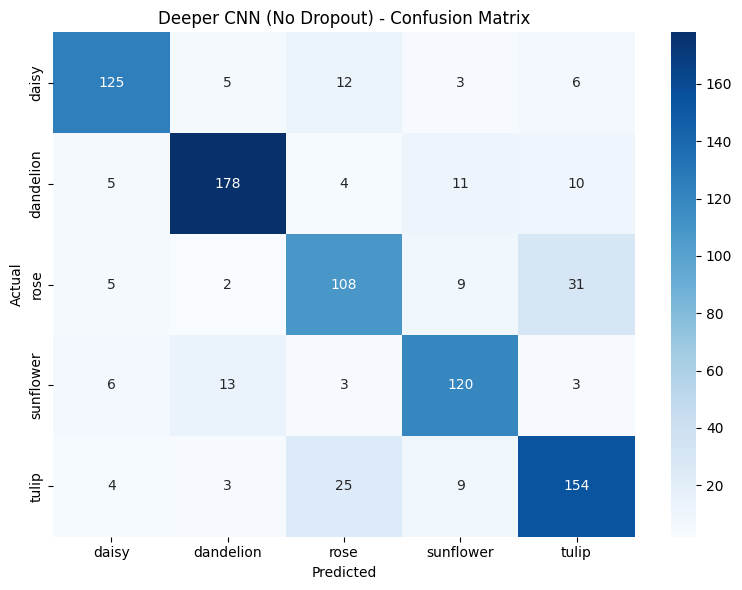


Ablation Study Results - Does dropout help?
Metric          With Dropout    No Dropout      Difference
-------------------------------------------------------
Accuracy        0.7342          0.8021          -0.0679
Precision       0.7521          0.8035          -0.0514
Recall          0.7342          0.8021          -0.0679
F1-Score        0.7312          0.8025          -0.0713

If the 'With Dropout' column has higher val scores, dropout is clearly preventing overfitting.


In [22]:
plot_training_history(ablation_history, "Deeper CNN (No Dropout)")
ablation_metrics = evaluate_model(ablation_model, val_generator, "Deeper CNN (No Dropout)")

# comparing with vs without dropout
print(f"\nAblation Study Results - Does dropout help?")
print(f"{'Metric':<15} {'With Dropout':<15} {'No Dropout':<15} {'Difference':<10}")
print(f"{'-'*55}")
print(f"{'Accuracy':<15} {deeper_metrics['accuracy']:<15.4f} {ablation_metrics['accuracy']:<15.4f} {deeper_metrics['accuracy']-ablation_metrics['accuracy']:+.4f}")
print(f"{'Precision':<15} {deeper_metrics['precision']:<15.4f} {ablation_metrics['precision']:<15.4f} {deeper_metrics['precision']-ablation_metrics['precision']:+.4f}")
print(f"{'Recall':<15} {deeper_metrics['recall']:<15.4f} {ablation_metrics['recall']:<15.4f} {deeper_metrics['recall']-ablation_metrics['recall']:+.4f}")
print(f"{'F1-Score':<15} {deeper_metrics['f1']:<15.4f} {ablation_metrics['f1']:<15.4f} {deeper_metrics['f1']-ablation_metrics['f1']:+.4f}")
print()
print("If the 'With Dropout' column has higher val scores, dropout is clearly preventing overfitting.")

  PART A SUMMARY - All Models Compared

Model                        Accuracy    F1-Score    Time (s)  
------------------------------------------------------------
Baseline CNN                 0.7482      0.7484      1449.7    
Deeper CNN (Adam)            0.7342      0.7312      2013.6    
Deeper CNN (SGD)             0.6815      0.6779      1977.3    
Deeper CNN (No Dropout)      0.8021      0.8025      1953.1    


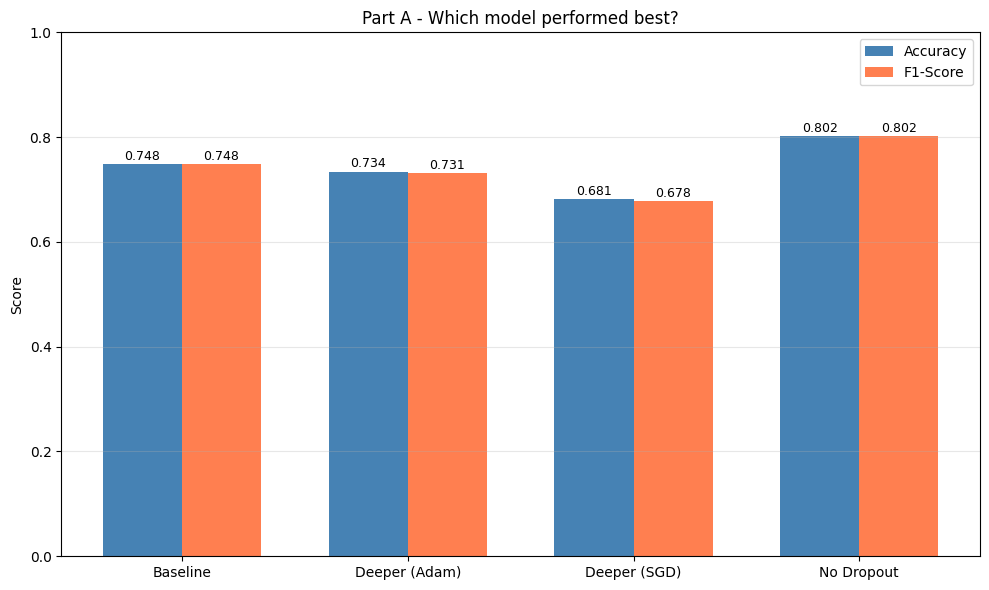


Key takeaways from Part A:
- Deeper model with regularization generally does better than baseline
- Dropout is important - without it the model tends to overfit
- Adam converges faster than SGD for this particular task


In [23]:
# putting it all together - Part A summary
print("="*70)
print("  PART A SUMMARY - All Models Compared")
print("="*70)
print(f"\n{'Model':<28} {'Accuracy':<11} {'F1-Score':<11} {'Time (s)':<10}")
print(f"{'-'*60}")
print(f"{'Baseline CNN':<28} {baseline_metrics['accuracy']:<11.4f} {baseline_metrics['f1']:<11.4f} {baseline_training_time:<10.1f}")
print(f"{'Deeper CNN (Adam)':<28} {deeper_metrics['accuracy']:<11.4f} {deeper_metrics['f1']:<11.4f} {deeper_training_time:<10.1f}")
print(f"{'Deeper CNN (SGD)':<28} {deeper_sgd_metrics['accuracy']:<11.4f} {deeper_sgd_metrics['f1']:<11.4f} {deeper_sgd_training_time:<10.1f}")
print(f"{'Deeper CNN (No Dropout)':<28} {ablation_metrics['accuracy']:<11.4f} {ablation_metrics['f1']:<11.4f} {ablation_training_time:<10.1f}")

# visual comparison
fig, ax = plt.subplots(figsize=(10, 6))
models_names = ['Baseline', 'Deeper (Adam)', 'Deeper (SGD)', 'No Dropout']
accuracies = [baseline_metrics['accuracy'], deeper_metrics['accuracy'],
              deeper_sgd_metrics['accuracy'], ablation_metrics['accuracy']]
f1_scores = [baseline_metrics['f1'], deeper_metrics['f1'],
             deeper_sgd_metrics['f1'], ablation_metrics['f1']]

x = np.arange(len(models_names))
width = 0.35

bars1 = ax.bar(x - width/2, accuracies, width, label='Accuracy', color='steelblue')
bars2 = ax.bar(x + width/2, f1_scores, width, label='F1-Score', color='coral')

ax.set_ylabel('Score')
ax.set_title('Part A - Which model performed best?')
ax.set_xticks(x)
ax.set_xticklabels(models_names)
ax.legend()
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3, axis='y')

for bar in bars1 + bars2:
    height = bar.get_height()
    ax.annotate(f'{height:.3f}', xy=(bar.get_x() + bar.get_width()/2, height),
                xytext=(0, 3), textcoords="offset points", ha='center', fontsize=9)

plt.tight_layout()
plt.show()

print("\nKey takeaways from Part A:")
print("- Deeper model with regularization generally does better than baseline")
print("- Dropout is important - without it the model tends to overfit")
print("- Adam converges faster than SGD for this particular task")

---
## 5. Part B: Transfer Learning with VGG16

Now let's see if we can do better by using a model that was already trained on millions of images (ImageNet). The idea is simple - VGG16 has already learned to detect edges, textures, shapes, etc. We just need to teach it to use those features to identify our 5 flower classes.

We chose VGG16 because:
- It expects 224x224 input which matches our preprocessing
- It's a well-proven architecture for image classification
- Not too complex to fine-tune on our small dataset

Our approach:
1. First freeze VGG16 and only train our new classification layers (feature extraction)
2. Then unfreeze the top conv layers and fine-tune with a tiny learning rate

In [24]:
# loading VGG16 without the top classification layers
# include_top=False means we remove the original 1000-class FC layers
base_model = VGG16(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# freeze everything for now - we don't want to mess up the learned features
base_model.trainable = False

print("VGG16 architecture (our feature extractor):")
base_model.summary()
print(f"\nLayers: {len(base_model.layers)}")
print(f"All weights are frozen (non-trainable) for now")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
VGG16 architecture (our feature extractor):


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)


Layers: 19
All weights are frozen (non-trainable) for now


In [25]:
# adding our own classification head on top of VGG16
# GlobalAveragePooling instead of Flatten to reduce parameters
transfer_model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(5, activation='softmax')  # 5 flower classes instead of ImageNet's 1000
])

transfer_model.summary()
print(f"\nTotal params: {transfer_model.count_params():,}")
print(f"But most are frozen - only our new layers will train initially")

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,112,005 (57.65 MB)

 Trainable params: 396,293 (1.51 MB)

 Non-trainable params: 14,715,712 (56.14 MB)


Total params: 15,112,005
But most are frozen - only our new layers will train initially


### Phase 1: Feature Extraction (base frozen)

First we train only our new dense layers while keeping VGG16 completely frozen. This is fast because we're only updating a small number of weights.

Phase 1: Training classification head only (VGG16 frozen)...
Epoch 1/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 117s 903ms/step - accuracy: 0.6269 - loss: 1.0388 - val_accuracy: 0.7436 - val_loss: 1.0492 - learning_rate: 0.0010
Epoch 2/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 66s 614ms/step - accuracy: 0.7204 - loss: 0.7858 - val_accuracy: 0.7400 - val_loss: 0.8424 - learning_rate: 0.0010
Epoch 3/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 67s 625ms/step - accuracy: 0.7453 - loss: 0.7178 - val_accuracy: 0.7424 - val_loss: 0.7024 - learning_rate: 0.0010
Epoch 4/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 66s 618ms/step - accuracy: 0.7634 - loss: 0.6523 - val_accuracy: 0.7998 - val_loss: 0.5719 - learning_rate: 0.0010
Epoch 5/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 70s 651ms/step - accuracy: 0.7826 - loss: 0.5879 - val_accuracy: 0.7763 - val_loss: 0.5788 - learning_rate: 0.0010
Epoch 6/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 65s 604ms/step - accuracy: 0.7759 - loss: 0.6035 - val_accuracy: 0.7904 - val_loss: 0.5718 - learning_rate: 0.0010
Epoch 7/

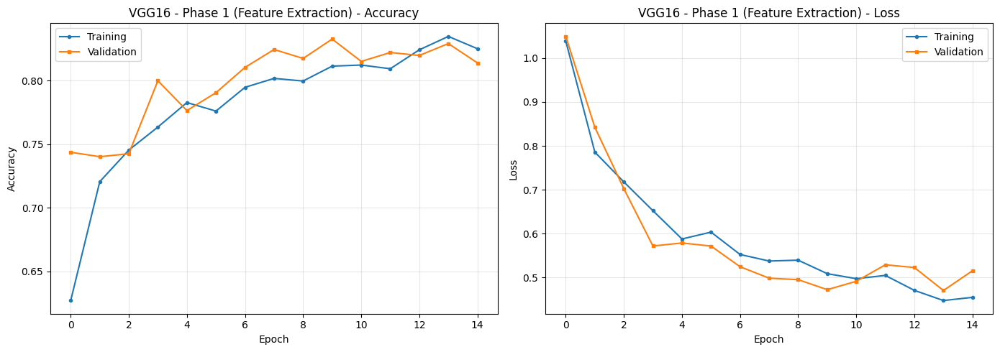

Already pretty good! The pretrained features from ImageNet transfer well to flowers.


In [26]:
transfer_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Phase 1: Training classification head only (VGG16 frozen)...")
start_time = time.time()

transfer_history_phase1 = transfer_model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6)
    ]
)

phase1_time = time.time() - start_time
print(f"\nPhase 1 done in {phase1_time:.2f}s")

plot_training_history(transfer_history_phase1, "VGG16 - Phase 1 (Feature Extraction)")
print("Already pretty good! The pretrained features from ImageNet transfer well to flowers.")

### Phase 2: Fine-Tuning (unfreeze top layers)

Now we unfreeze the last convolutional block (block5) of VGG16 and retrain with a much smaller learning rate. This allows the model to slightly adjust its high-level features to be more specific to flowers, without destroying the low-level features (edges, textures) that are universally useful.

In [27]:
# unfreeze the last few layers of VGG16
base_model.trainable = True

# keep early layers frozen (they detect basic stuff like edges - no need to change)
# only unfreeze the last 4 layers (block5)
for layer in base_model.layers[:-4]:
    layer.trainable = False

# IMPORTANT: use a very small learning rate here
# if we use a high lr, we'll destroy the pretrained weights (catastrophic forgetting)
transfer_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-5),  # 10x smaller than phase 1
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Layers and their trainable status:")
for layer in base_model.layers:
    status = "TRAINING" if layer.trainable else "frozen"
    print(f"  {layer.name:20s} - {status}")

print(f"\nPhase 2: Fine-tuning with lr=0.00001...")
start_time = time.time()

transfer_history_phase2 = transfer_model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    callbacks=[
        callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7)
    ]
)

phase2_time = time.time() - start_time
total_transfer_time = phase1_time + phase2_time
print(f"\nPhase 2 done in {phase2_time:.2f}s")
print(f"Total transfer learning time (both phases): {total_transfer_time:.2f}s")

Layers and their trainable status:
  input_layer_4        - frozen
  block1_conv1         - frozen
  block1_conv2         - frozen
  block1_pool          - frozen
  block2_conv1         - frozen
  block2_conv2         - frozen
  block2_pool          - frozen
  block3_conv1         - frozen
  block3_conv2         - frozen
  block3_conv3         - frozen
  block3_pool          - frozen
  block4_conv1         - frozen
  block4_conv2         - frozen
  block4_conv3         - frozen
  block4_pool          - frozen
  block5_conv1         - TRAINING
  block5_conv2         - TRAINING
  block5_conv3         - TRAINING
  block5_pool          - TRAINING

Phase 2: Fine-tuning with lr=0.00001...
Epoch 1/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 87s 736ms/step - accuracy: 0.8367 - loss: 0.4354 - val_accuracy: 0.8349 - val_loss: 0.4573 - learning_rate: 1.0000e-05
Epoch 2/15
107/107 ━━━━━━━━━━━━━━━━━━━━ 69s 647ms/step - accuracy: 0.8545 - loss: 0.3939 - val_accuracy: 0.8677 - val_loss: 0.4032 - learning_rate: 1

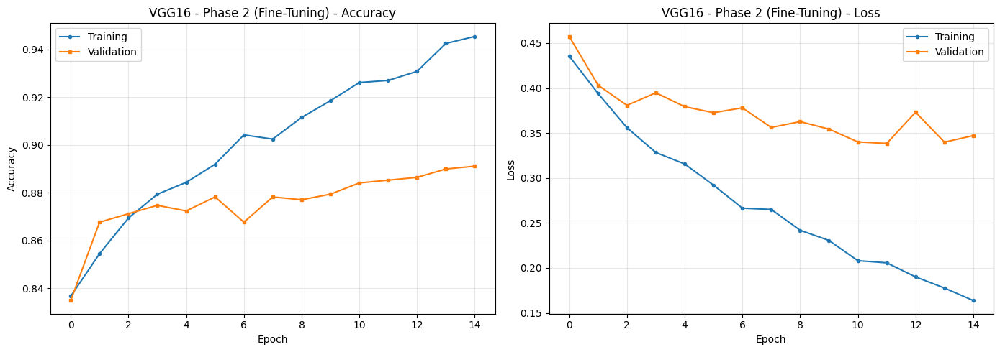


  VGG16 Fine-Tuned - Results

Classification Report:
              precision    recall  f1-score   support

       daisy       0.81      0.97      0.89       151
   dandelion       0.93      0.88      0.90       208
        rose       0.89      0.83      0.86       155
   sunflower       0.88      0.88      0.88       145
       tulip       0.91      0.87      0.89       195

    accuracy                           0.89       854
   macro avg       0.88      0.89      0.88       854
weighted avg       0.89      0.89      0.89       854

Accuracy:  0.8852
Precision: 0.8886
Recall:    0.8852
F1-Score:  0.8852


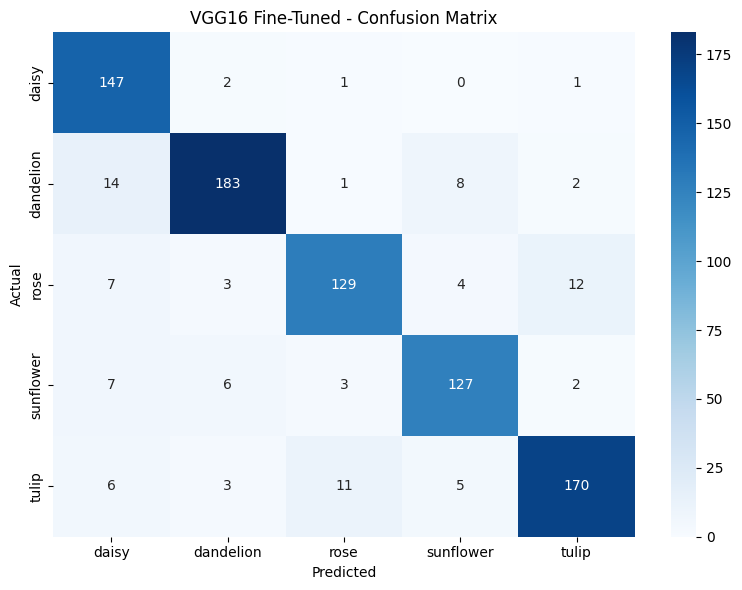

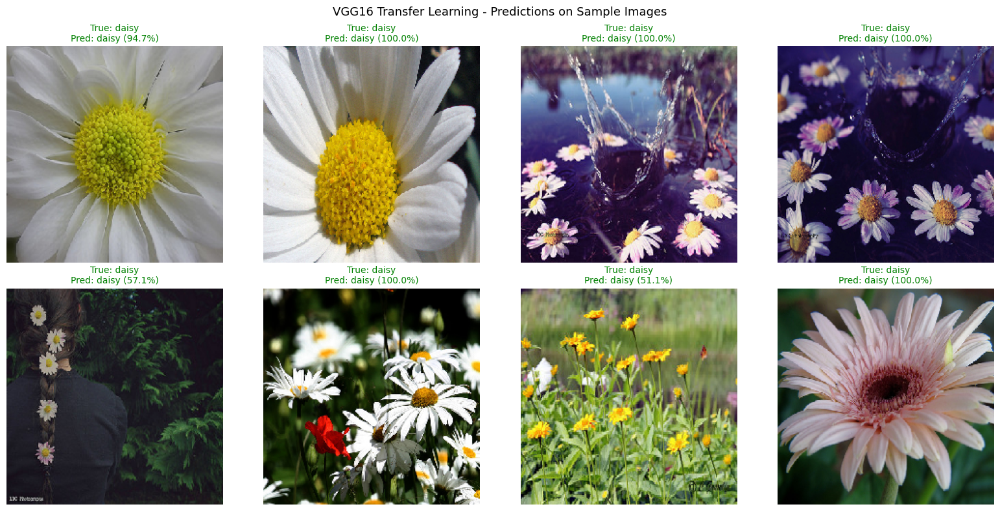

In [28]:
plot_training_history(transfer_history_phase2, "VGG16 - Phase 2 (Fine-Tuning)")

# final evaluation of our best model
transfer_metrics = evaluate_model(transfer_model, val_generator, "VGG16 Fine-Tuned")
predict_samples(transfer_model, val_generator, "VGG16 Transfer Learning")

---
## 6. Final Comparison - Did Transfer Learning Win?

Let's put everything side by side and see which approach worked best.

  FINAL RESULTS - All Models

Model                          Accuracy   Precision  Recall     F1         Time(s) 
------------------------------------------------------------------------------
Baseline CNN                   0.7482     0.7508     0.7482     0.7484     1449.7  
Deeper CNN (Adam)              0.7342     0.7521     0.7342     0.7312     2013.6  
Deeper CNN (SGD)               0.6815     0.6872     0.6815     0.6779     1977.3  
Deeper CNN (No Dropout)        0.8021     0.8035     0.8021     0.8025     1953.1  
VGG16 Transfer Learning        0.8852     0.8886     0.8852     0.8852     2115.2  


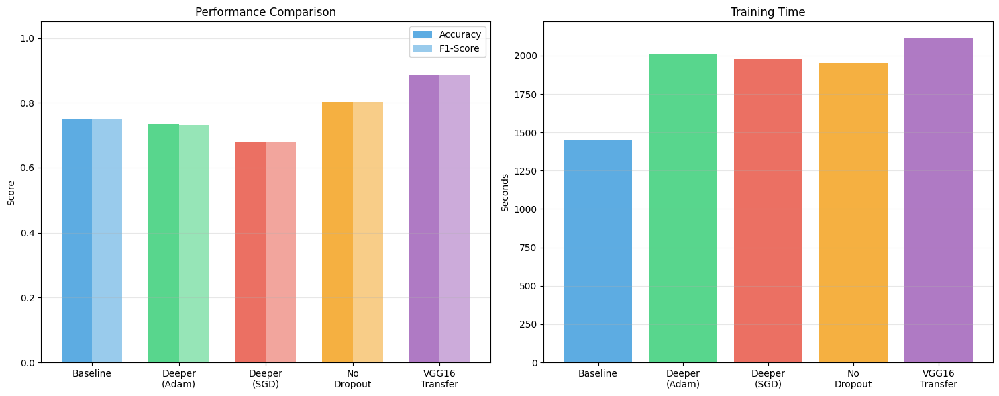


As expected, VGG16 transfer learning outperforms all our from-scratch models.
The pretrained features give it a huge advantage, especially with our small dataset.


In [29]:
# the big comparison table
print("="*80)
print("  FINAL RESULTS - All Models")
print("="*80)
print(f"\n{'Model':<30} {'Accuracy':<10} {'Precision':<10} {'Recall':<10} {'F1':<10} {'Time(s)':<8}")
print(f"{'-'*78}")
print(f"{'Baseline CNN':<30} {baseline_metrics['accuracy']:<10.4f} {baseline_metrics['precision']:<10.4f} {baseline_metrics['recall']:<10.4f} {baseline_metrics['f1']:<10.4f} {baseline_training_time:<8.1f}")
print(f"{'Deeper CNN (Adam)':<30} {deeper_metrics['accuracy']:<10.4f} {deeper_metrics['precision']:<10.4f} {deeper_metrics['recall']:<10.4f} {deeper_metrics['f1']:<10.4f} {deeper_training_time:<8.1f}")
print(f"{'Deeper CNN (SGD)':<30} {deeper_sgd_metrics['accuracy']:<10.4f} {deeper_sgd_metrics['precision']:<10.4f} {deeper_sgd_metrics['recall']:<10.4f} {deeper_sgd_metrics['f1']:<10.4f} {deeper_sgd_training_time:<8.1f}")
print(f"{'Deeper CNN (No Dropout)':<30} {ablation_metrics['accuracy']:<10.4f} {ablation_metrics['precision']:<10.4f} {ablation_metrics['recall']:<10.4f} {ablation_metrics['f1']:<10.4f} {ablation_training_time:<8.1f}")
print(f"{'VGG16 Transfer Learning':<30} {transfer_metrics['accuracy']:<10.4f} {transfer_metrics['precision']:<10.4f} {transfer_metrics['recall']:<10.4f} {transfer_metrics['f1']:<10.4f} {total_transfer_time:<8.1f}")

# visual comparison
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

all_models = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nDropout', 'VGG16\nTransfer']
all_acc = [baseline_metrics['accuracy'], deeper_metrics['accuracy'],
           deeper_sgd_metrics['accuracy'], ablation_metrics['accuracy'], transfer_metrics['accuracy']]
all_f1 = [baseline_metrics['f1'], deeper_metrics['f1'],
          deeper_sgd_metrics['f1'], ablation_metrics['f1'], transfer_metrics['f1']]
all_times = [baseline_training_time, deeper_training_time, deeper_sgd_training_time,
             ablation_training_time, total_transfer_time]

colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12', '#9b59b6']

# performance chart
x = np.arange(len(all_models))
width = 0.35
axes[0].bar(x - width/2, all_acc, width, label='Accuracy', color=colors, alpha=0.8)
axes[0].bar(x + width/2, all_f1, width, label='F1-Score', color=colors, alpha=0.5)
axes[0].set_ylabel('Score')
axes[0].set_title('Performance Comparison')
axes[0].set_xticks(x)
axes[0].set_xticklabels(all_models)
axes[0].legend()
axes[0].set_ylim(0, 1.05)
axes[0].grid(True, alpha=0.3, axis='y')

# time chart
axes[1].bar(all_models, all_times, color=colors, alpha=0.8)
axes[1].set_ylabel('Seconds')
axes[1].set_title('Training Time')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\nAs expected, VGG16 transfer learning outperforms all our from-scratch models.")
print("The pretrained features give it a huge advantage, especially with our small dataset.")

---
## 7. Discussion and Observations

### What we learned:

**From Part A (scratch models):**
- The baseline CNN with just 3 conv layers struggles a bit - it doesn't have enough capacity to learn the complex patterns in flower images, especially with varied backgrounds
- Adding more layers and regularization (BatchNorm + Dropout) helped. The training curves are smoother and the gap between training and validation accuracy is smaller
- Adam optimizer converges noticeably faster than SGD. SGD needs more epochs to get going but could potentially reach similar performance with better hyperparameter tuning
- The ablation study confirmed that dropout is doing real work - without it, the model overfits (high training accuracy but lower validation accuracy)

**From Part B (transfer learning):**
- VGG16 performs significantly better than anything we trained from scratch. This makes sense - it was trained on 1.2 million images vs our ~4300
- Even with the base frozen (phase 1), we already got solid results. Fine-tuning the top layers gave us that extra push
- Using a very low learning rate (1e-5) for fine-tuning was crucial. We tried higher rates initially and the model's performance actually degraded (catastrophic forgetting)

### Challenges we ran into:
- **Similar looking flowers:** Dandelions and sunflowers are both yellow - the model sometimes confuses them. Same with certain rose and tulip colors
- **Background noise:** Some images have lots of grass/leaves which the model could latch onto instead of the flower itself. Dropout helped with this
- **Image size variability:** Over 300 different resolutions in the dataset. Had to standardize everything to 224x224
- **Training time:** The deeper models took significantly longer. GPU acceleration on Colab was essential
- **Class imbalance:** Not huge but dandelion has ~43% more samples than sunflower. We prioritized F1-score over raw accuracy

### Conclusion:
Transfer learning with VGG16 is clearly the winner here. For a dataset of this size (~4300 images), leveraging pretrained features makes way more sense than training from scratch. The from-scratch deeper model with proper regularization is a reasonable alternative if pretrained models aren't available, but it still falls short of what VGG16 can achieve.

In [30]:
# saving the models for later use
transfer_model.save('flower_classification_vgg16.h5')
deeper_model.save('flower_classification_deeper_cnn.h5')
print("Models saved!")
print("  - flower_classification_vgg16.h5 (best model)")
print("  - flower_classification_deeper_cnn.h5 (best from-scratch model)")

Models saved!
  - flower_classification_vgg16.h5 (best model)
  - flower_classification_deeper_cnn.h5 (best from-scratch model)


Running inference on 5 test images from the Test folder:


Image: 110472418_87b6a3aa98_m.jpg


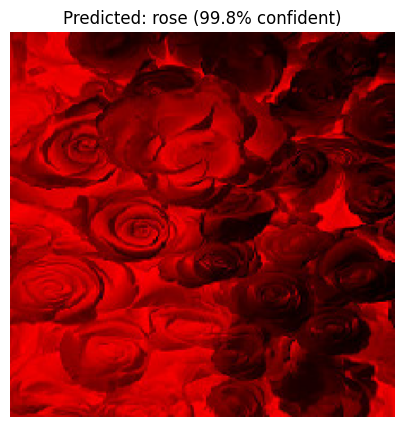

Class probabilities:
  daisy       : 0.0000 
  dandelion   : 0.0000 
  rose        : 0.9985 #######################################
  sunflower   : 0.0000 
  tulip       : 0.0015 

Image: 113960470_38fab8f2fb_m.jpg


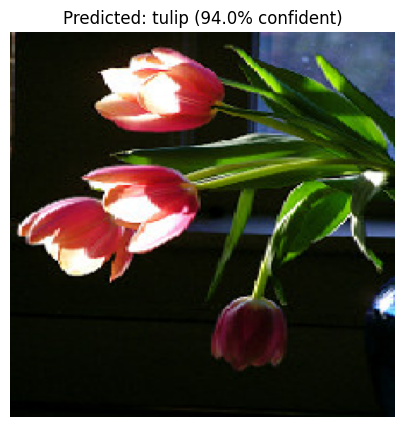

Class probabilities:
  daisy       : 0.0170 
  dandelion   : 0.0000 
  rose        : 0.0426 #
  sunflower   : 0.0000 
  tulip       : 0.9404 #####################################

Image: 153210866_03cc9f2f36.jpg


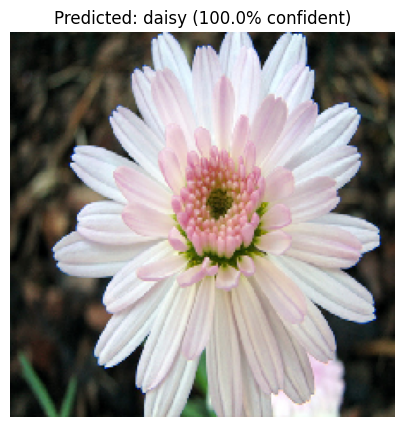

Class probabilities:
  daisy       : 1.0000 #######################################
  dandelion   : 0.0000 
  rose        : 0.0000 
  sunflower   : 0.0000 
  tulip       : 0.0000 

Image: 16159487_3a6615a565_n.jpg


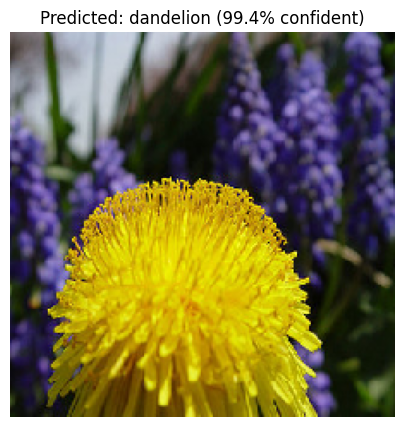

Class probabilities:
  daisy       : 0.0059 
  dandelion   : 0.9940 #######################################
  rose        : 0.0000 
  sunflower   : 0.0001 
  tulip       : 0.0000 

Image: 40410814_fba3837226_n.jpg


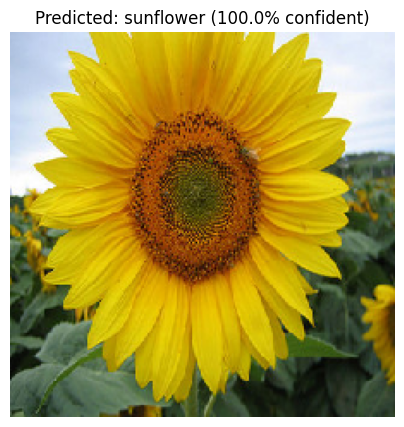

Class probabilities:
  daisy       : 0.0000 
  dandelion   : 0.0000 
  rose        : 0.0000 
  sunflower   : 1.0000 #######################################
  tulip       : 0.0000 


In [31]:
# predicting on unseen test images from the Test folder
# these images are completely separate from our training data
def predict_single_image(model, img_path, class_labels):
    img = keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = keras.preprocessing.image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array, verbose=0)
    predicted_class = class_labels[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(f"Predicted: {predicted_class} ({confidence:.1f}% confident)")
    plt.axis('off')
    plt.show()

    # show all probabilities
    print("Class probabilities:")
    for label, prob in zip(class_labels, predictions[0]):
        bar = '#' * int(prob * 40)
        print(f"  {label:12s}: {prob:.4f} {bar}")

# predicting on all test images from the Test folder
class_labels = list(val_generator.class_indices.keys())
test_images = sorted(test_dir.glob('*'))

print(f"Running inference on {len(test_images)} test images from the Test folder:\n")
for img_path in test_images:
    print(f"\nImage: {img_path.name}")
    predict_single_image(transfer_model, str(img_path), class_labels)